# The Game of Life on Penrose Tilings: Robinson Triangle
##### Seung Hyeon Mandy Hong

In [15]:
#Packages we are using
using Luxor #For graphics
using JLD2 #For saving variables as file

# 1. Generating Robinson Triangle Tiling Using Substitution Method

a. Drawing Prototiles (wider upward/downward triangle, narrower upward/downward triangle)

In [16]:
#distance calculated to draw robinson triangle
phi=(1+sqrt(5))/2

#wider triangle
h_w=sin(π/5)*(phi)
a_w=cos(π/5)*(phi)

#narrower triangle
h_n=sin((2/5)*pi)*phi
a_n=1/2

#Four Functions to draw prototiles
#Parameters: s is the size/side length of each tile
#Output: Graphic of each tile 

#Function to draw wider upward traingle, 
#Using above information, get three coordinates of the triangle and send it to poly[] function which draw polygon
function wider_triangle_up(s) 
    poly([Point(0, 0), Point(s*a_w, s*h_w), Point(-s*(a_w), s*h_w)], :fill)
end


#Function to draw wider downward traingle, 
#Using above information, get three coordinates of the triangle and send it to poly[] function which draw polygon
function wider_triangle_down(s) 
    poly([Point(0, 0), Point(s*a_w, -s*(h_w)), Point(-s*(a_w), -s*(h_w))], :fill)
end

#Function to draw narrower upward traingle 
#Using above information, get three coordinates of the triangle and send it to poly[] function which draw polygon
function narrower_triangle_up(s)
    poly([Point(0, 0), Point(s*a_n, s*h_n), Point(-s*(a_n), s*h_n)], :fill)
end

#Function to draw narrower downward traingle, 
#Using above information, get three coordinates of the triangle and send it to poly[] function which draw polygon
function narrower_triangle_down(s) 
    poly([Point(0, 0), Point(s*a_n, -s*(h_n)), Point(-s*(a_n), -s*(h_n))], :fill)
end

#Four Functions to draw prototiles, only strokes (lines)
#Parameters: s is the size/side length of each tile
#Output: Graphic of each tile 

#Function to draw stroke of w_u traingle
#Changed :fill into :stroke and add one more coordinate, to close stroke
function wider_triangle_up_stroke(s) 
    poly([Point(0, 0), Point(s*a_w, s*h_w), Point(-s*(a_w), s*h_w), Point(0, 0)], :stroke)
end

#Function to draw stroke of w_d traingle
#Changed :fill into :stroke and add one more coordinate, to close stroke
function wider_triangle_down_stroke(s) 
    poly([Point(0, 0), Point(s*a_w, -s*(h_w)), Point(-s*(a_w), -s*(h_w)), Point(0,0)], :stroke)
end

#Function to draw stroke of n_u traingle
#Changed :fill into :stroke and add one more coordinate, to close stroke 
function narrower_triangle_up_stroke(s) 
    poly([Point(0, 0), Point(s*a_n, s*h_n), Point(-s*(a_n), s*h_n), Point(0,0)], :stroke)
end

#Function to draw stroke of n_d traingle
#Changed :fill into :stroke and add one more coordinate, to close stroke
function narrower_triangle_down_stroke(s) 
    poly([Point(0, 0), Point(s*a_n, -s*(h_n)), Point(-s*(a_n), -s*(h_n)), Point(0,0)], :stroke)
end

#Four Functions to get three coordinates of each prototiles
#Parameters: s is the size/side length of each tile
#Output: List of coordinates of each tile 

#Function to get wider upward triangle coordinates as a list
function w_trianlge_up_coordinate(s)
    w_u_L=[Point(0, 0), Point(s*a_w, s*h_w), Point(-s*(a_w), s*h_w)]
    return w_u_L
end

#Function to get wider downward triangle coordinates as a list
function w_trianlge_down_coordinate(s)
    w_d_L=[Point(0, 0), Point(s*a_w, -s*(h_w)), Point(-s*(a_w), -s*(h_w))]
    return w_d_L
end

#Function to get narrower upward triangle coordinates as a list
function n_trianlge_up_coordinate(s)
    n_u_L=[Point(0, 0), Point(s*a_n, s*h_n), Point(-s*(a_n), s*h_n)]
    return n_u_L
end

#Function to get narrower downward triangle coordinates as a list
function n_trianlge_down_coordinate(s)
    n_d_L=[Point(0, 0), Point(s*a_n, -s*(h_n)), Point(-s*(a_n), -s*(h_n))]
    return n_d_L
end

n_trianlge_down_coordinate (generic function with 1 method)

b. Modifying coordinates when the tile is rotated or translated

In [17]:
#Function to get new coordinate when the tile is rotated given current coordinates.
#Parameter: pL is original coordinate of the prototile
           #orientation is how much each tile is being rotated
#Output: modified coordinates when the tile is rotated
function new_coordinate_r(pL, orientation)
    newP_o=Point[] #create empty vector to store new points
    for i in 1:length(pL) 
        old_x=pL[i][1] #get original x coordinate
        old_y=pL[i][2] #get original y coordinate
        new_x=(old_x*cos(orientation)-old_y*sin(orientation)) #get new x-coordinate when rotated
        new_y=(old_x*sin(orientation)+old_y*cos(orientation)) #get new y-coordinate when rotated
        p=Point(new_x,new_y) #create new point
        push!(newP_o,p) #add that point to empty vector
    end  
    return newP_o #generated new point when rotated
end

#Function to get new coordinate when the tile is translated given current coordinates.
#Parameter: pointL is original coordinate of the prototile
           #translate is where we want to locate our original point by translation, in a Point() form
#Output: modified coordinates when the tile is translated
function new_coordinate_t(translate, pointL) #point list and orientation
    newP_t=Point[] #create empty vector to store new points
    for i in 1:length(pointL)
        p=pointL[i]+translate #going over all points, add Point (translate)
        push!(newP_t,p) #add that point to empty vector
    end  
    return newP_t #generated new point when translated
end


new_coordinate_t (generic function with 1 method)

c. Generating Robinson triangle tiling using substitution method

In [18]:
#Function to get tiling using substitution method
#Parameter: upper_level_coordinatesL is the initial configuration of the tile (level-0 substitution). List of origins of each tile in Point() format. 
          # nstep indicates the level of substitution
          # size is the side length of a tile in initial configuration
#Output: List of tile in level-n substitution tiling with each tile's tile type, origin, and orientation
function substitution_robinson_triangle_list(upper_level_coordinatesL,nstep,size)
    for i in 1:nstep #repeat same process for n-step times
        s=size*phi^(i-1) #after each step, the size of tile increase by phi, inflation factor
        initial=upper_level_coordinatesL #initial configuration or upper level configuration
        v=Any[] #create empty vector to store output values
        current_step=i
        if i == 1 || i == 2 #Information we need to update coordinates
            multiple=current_step
        else #Information we need to update coordinates
            multiple=2
        end
        for i in 1:length(initial) #going over the input
            if initial[i][1] == "w_u" #if tile type is wider upward triangle
                coordinate=Point[] #create new empty vector
                
                #First, inflate tile.
                w_u_L=w_trianlge_up_coordinate(s*phi) #get inflated wider upward trianlge coordinate
                position=initial[i][2]*phi^multiple #where tile will be translated by inflation. Multiply initial position by phi^multiple
                orientation=initial[i][3] #how much tile is rotated
                append!(coordinate, w_u_L)
                new_p1=Point(w_u_L[3][1]+phi^1*s, w_u_L[3][2]) #new point to start subdividing
                push!(coordinate, new_p1)
                new_p2=Point(w_u_L[1][1]+-s*(a_w*phi^1-phi^1), w_u_L[1][2]+s*h_n*phi^0)#new point to start subdividing
                push!(coordinate, new_p2)
                new_p3=Point(w_u_L[2][1]-a_w*s*phi^0,w_u_L[2][2]-s*h_w*phi^0)#new point to start subdividing
                push!(coordinate, new_p3)

                inflate_r=new_coordinate_r(coordinate, orientation) #get coordinate after rotation
                inflate2=new_coordinate_t(position,inflate_r) #get coordinate after translation

                o=orientation #current orientation

                #Second, subdivide inflated tile.
                #a. wider upward triangle
                sub1=w_trianlge_up_coordinate(s)
                position=inflate2[4] 
                orientation=8pi/10+o
                sub1_r=new_coordinate_r(sub1, orientation) #get coordinate after rotation
                sub1_final=new_coordinate_t(position,sub1_r) #get coordinate after translation

                V=[["w_u", position, orientation]] #create vector with this info             
                append!(v, V) #add to output vector

                #b. narrower downward triangle
                sub2=n_trianlge_down_coordinate(s)
                position=inflate2[5]
                orientation=pi/5+o
                sub2_r=new_coordinate_r(sub2, orientation) #get coordinate after rotation
                sub2_final=new_coordinate_t(position,sub2_r) #get coordinate after translation

                V=[["n_d", position, orientation]] #create vector with this info             
                append!(v, V) #add to output vector

                #c. wider downward triangle
                sub3=w_trianlge_down_coordinate(s)
                position=inflate2[6]
                orientation=pi+o
                sub3_r=new_coordinate_r(sub3, orientation) #get coordinate after rotation
                sub3_final=new_coordinate_t(position,sub3_r) #get coordinate after translation

                V=[["w_d", position, orientation]] #create vector with this info             
                append!(v, V) #add to output vector

            elseif initial[i][1] == "w_d" #if tile type is wider downward triangle
                coordinate=Point[]
                
                #First, inflate tile.
                w_d_L=w_trianlge_down_coordinate(s*phi) #get inflated wider downard trianlge coordinate
                #below code explanation is same from above
                position=initial[i][2]*phi^multiple
                orientation=initial[i][3] 
                append!(coordinate, w_d_L)
                new_p1=Point(w_d_L[3][1]+phi^1*s, w_d_L[3][2])
                push!(coordinate, new_p1)
                new_p2=Point(w_d_L[1][1]+-s*(a_w*phi^1-phi^1), w_d_L[1][2]-s*h_n*phi^0)
                push!(coordinate, new_p2)
                new_p3=Point(w_d_L[2][1]-a_w*s*phi^0,w_d_L[2][2]+s*h_w*phi^0)
                push!(coordinate, new_p3)

                inflate_r=new_coordinate_r(coordinate, orientation) #get coordinate after rotation
                inflate2=new_coordinate_t(position,inflate_r) #get coordinate after translation

                o=orientation

                #Second, subdivide inflated tile.
                #a. wider downward triangle
                sub1=w_trianlge_down_coordinate(s)
                position=inflate2[4]
                orientation=-8pi/10+o
                sub1_r=new_coordinate_r(sub1, orientation) #get coordinate after rotation
                sub1_final=new_coordinate_t(position,sub1_r) #get coordinate after translation

                V=[["w_d", position, orientation]] #create vector with this info             
                append!(v, V) #add to output vector


                #b. narrower upward triangle
                sub2=n_trianlge_up_coordinate(s)
                position=inflate2[5]
                orientation=-pi/5+o
                sub2_r=new_coordinate_r(sub2, orientation) #get coordinate after rotation
                sub2_final=new_coordinate_t(position,sub2_r) #get coordinate after translation

                V=[["n_u", position, orientation]] #create vector with this info             
                append!(v, V) #add to output vector

                #c. wider upward triangle
                sub3=w_trianlge_up_coordinate(s)
                position=inflate2[6]
                orientation=pi+o
                sub3_r=new_coordinate_r(sub3, orientation) #get coordinate after rotation
                sub3_final=new_coordinate_t(position,sub3_r) #get coordinate after translation
                
                V=[["w_u", position, orientation]] #create vector with this  info             
                append!(v, V) #add to output vector
                

            elseif initial[i][1] == "n_u" #if tile type is narrower upward triangle
                coordinate=Point[]
                
                #First, inflate tile.
                n_u_L=n_trianlge_up_coordinate(s*phi) #get inflated narrower upward trianlge coordinate
                position=initial[i][2]*phi^multiple
                orientation=initial[i][3] 
                append!(coordinate, n_u_L)
                new_p1=Point(n_u_L[2][1]-(cos(2pi/5)*phi^0*s), n_u_L[2][2]-(sin(2pi/5)*phi^0*s))
                push!(coordinate, new_p1)

                inflate_r=new_coordinate_r(coordinate, orientation) #get coordinate after rotation
                inflate2=new_coordinate_t(position,inflate_r) #get coordinate after translation

                o=orientation
                
                #Second, subdivide inflated tile.
                #a. wider upward triangle
                sub1=w_trianlge_up_coordinate(s)
                position=inflate2[4]
                orientation=3pi/5+o
                sub1_r=new_coordinate_r(sub1, orientation) #get coordinate after rotation
                sub1_final=new_coordinate_t(position,sub1_r) #get coordinate after translation

                V=[["w_u", position, orientation]] #create vector with this info             
                append!(v, V) #add to output vector


                #b. narrower upward triangle
                sub2=n_trianlge_up_coordinate(s)
                position=inflate2[3]
                orientation=-3pi/5+o
                sub2_r=new_coordinate_r(sub2, orientation) #get coordinate after rotation
                sub2_final=new_coordinate_t(position,sub2_r) #get coordinate after translation

                V=[["n_u", position, orientation]] #create vector with this info             
                append!(v, V) #add to output vector

            else #if tile type is narrower downward triangle
                coordinate=Point[]
                
                #First, inflate tile.
                n_d_L=n_trianlge_down_coordinate(s*phi) #get inflated narrower downward trianlge coordinate
                position=initial[i][2]*phi^multiple
                orientation=initial[i][3]
                append!(coordinate, n_d_L)
                new_p1=Point(n_d_L[2][1]-(cos(2pi/5)*phi^0*s), n_d_L[2][2]+(sin(2pi/5)*phi^0*s))
                push!(coordinate, new_p1)

                inflate_r=new_coordinate_r(coordinate, orientation) #get coordinate after rotation
                inflate2=new_coordinate_t(position,inflate_r) #get coordinate after translation

                o=orientation

                #Second, subdivide inflated tile.
                #a. wider downward triangle
                sub1=w_trianlge_down_coordinate(s)
                position=inflate2[4]
                orientation=-3pi/5+o
                sub1_r=new_coordinate_r(sub1, orientation) #get coordinate after rotation
                sub1_final=new_coordinate_t(position,sub1_r) #get coordinate after translation

                V=[["w_d", position, orientation]] #create vector with this info             
                append!(v, V) #add to output vector

                #b. narrower downward triangle
                sub2=n_trianlge_down_coordinate(s)
                position=inflate2[3]
                orientation=3pi/5+o
                sub2_r=new_coordinate_r(sub2, orientation) #get coordinate after rotation
                sub2_final=new_coordinate_t(position,sub2_r) #get coordinate after translation

                V=[["n_d", position, orientation]] #create vector with this info             
                append!(v, V) #add to output vector

            end
        end
        upper_level_coordinatesL=v #update input for next level substitution
    end
    return upper_level_coordinatesL #get final list after n-step substitution, outupe we want
end

substitution_robinson_triangle_list (generic function with 1 method)

d. Generating graphics of tiling

In [19]:
#Function to generate Robinson triangle tiling graphic in png format
#Parameter: nstep indicates the level of substitution
          # list is substitution list, output of substitution function
          # size is the side length of a tile in initial configuration
          # graphic_size is the size of png file
#Output: Entire tiling as png format
function plot_Robison_Triangle_png(nstep, list, size, graphic_size)
    Drawing(graphic_size, graphic_size, "underlying_tiling.png") #indicate width/height of the graphic, and graphic name
    origin() #start from origin
    if nstep == 0
        size=size*phi
    else
        size=size
    end
    s=size*phi^(nstep-1) #s is side length of each tile
    
    for i in 1:length(list) #going over all tiles in list,
        translate(list[i][2]) #move to origin (coordinate) of ith tile
        rotate(list[i][3]) #change orientation of ith tile using given info
        if list[i][1]=="w_u" #if ith tile is wider upward triangle,
            sethue("rebeccapurple") #use this color
            wider_triangle_up(s) #and draw wider upward triangle of size s
        elseif list[i][1]=="w_d" #if ith tile is wider downward triangle,
            sethue("lavender") #use this color
            wider_triangle_down(s) #and draw wider downward triangle of size s
        elseif list[i][1]=="n_u" #if ith tile is narrower upward triangle,
            sethue("lightgoldenrod1") #use this color
            narrower_triangle_up(s) #and draw narrower upward triangle of size s
        else #if ith tile is narrower downward triangle
            sethue("sienna1") #use this color
            narrower_triangle_down(s) #and draw narrower downward triangle of size s
        end
        origin() #go back to origin for plotting next tile
    end
    finish() #finish drawing
    preview() #show what we have
end

#Function that is a modified version of plotting function. Generate Robinson triangle tiling graphic (stroke) in png format
#Parameter: nstep indicates the level of substitution
          # list is substitution list, output of substitution function
          # size is the side length of a tile in initial configuration
          # graphic_size is the size of png file
#Output: Entire tiling without color, only lines as png format
function plot_Robison_Triangle_stroke_png(nstep, list, size, graphic_size)
    Drawing(graphic_size, graphic_size, "underlying_tiling_stroke.png") #indicate width/height of the graphic, and graphic name
    origin() #start from origin
    if nstep == 0
        size=size*phi
    else
        size=size
    end
    
    s=size*phi^(nstep-1) #s is size of each tile
    
    for i in 1:length(list) #going over all tiles in list,
        translate(list[i][2]) #move to origin (coordinate) of ith tile
        rotate(list[i][3]) #change orientation of ith tile using given info
        if list[i][1]=="w_u" #if ith tile is wider upward triangle,
            wider_triangle_up_stroke(s) #and draw stroke of wider upward triangle of size s
        elseif list[i][1]=="w_d" #if ith tile is wider downward triangle,
            wider_triangle_down_stroke(s) #and draw stroke of wider downward triangle of size s
        elseif list[i][1]=="n_u" #if ith tile is narrower upward triangle,
            narrower_triangle_up_stroke(s) #and draw stroke of narrower upward triangle of size s
        else #if ith tile is narrower downward triangle
            narrower_triangle_down_stroke(s) #and draw stroke of narrower downward triangle of size s
        end
        origin() #go back to origin for plotting next tile
    end
    finish() #finish drawing
    preview() #show what we have
end

plot_Robison_Triangle_stroke_png (generic function with 2 methods)

# 2. Getting Neighboring Tiles' Information

a. Getting coordinates of tiles in level-n substitution tiling

In [20]:
#Modified version of substitution function

#Function to generate list with tile type and three coordinate instead of position and orientation after level-n substitution
#Parameter: upper_level_coordinatesL is the initial configuration of the tile (level-0 substitution). List of origins of each tile in Point() format. 
          # nstep indicates the level of substitution
          # size is the side length of a tile in initial configuration
#Output: List of tile in level-n substitution tiling with each tile's tile type, and three coordinates

function coordinate_list(upper_level_coordinatesL,nstep,size)
    c_l=Any[]
    for i in 1:nstep #repeat same process for n-step times
        s=size*phi^(i-1) #after each step, the size of tile increase by phi, inflation factor
        initial=upper_level_coordinatesL #initial configuration or upper level configuration
        v=Any[] #create empty vector to store output values
        c_l=Any[] #create empty vector to store coordinate list
        current_step=i 
        if i == 1 || i == 2 #Information we need to update coordinates
            multiple=current_step
        else #Information we need to update coordinates
            multiple=2
        end
        
        for i in 1:length(initial) #going over the input
            #most part are same from substitution function 
            #therfore, skipped commenting unless it is new command
            if initial[i][1] == "w_u"
                coordinate=Point[]
                
                #First, inflate tile.
                w_u_L=w_trianlge_up_coordinate(s*phi) 
                position=initial[i][2]*phi^multiple
                orientation=initial[i][3] 
                append!(coordinate, w_u_L)
                new_p1=Point(w_u_L[3][1]+phi^1*s, w_u_L[3][2])
                push!(coordinate, new_p1)
                new_p2=Point(w_u_L[1][1]+-s*(a_w*phi^1-phi^1), w_u_L[1][2]+s*h_n*phi^0)
                push!(coordinate, new_p2)
                new_p3=Point(w_u_L[2][1]-a_w*s*phi^0,w_u_L[2][2]-s*h_w*phi^0)
                push!(coordinate, new_p3)

                inflate_r=new_coordinate_r(coordinate, orientation) 
                inflate2=new_coordinate_t(position,inflate_r) 

                o=orientation

                #Second, subdivide inflated tile.
                #a. wider upward triangle
                sub1=w_trianlge_up_coordinate(s)
                position=inflate2[4]
                orientation=8pi/10+o
                sub1_r=new_coordinate_r(sub1, orientation)
                sub1_final=new_coordinate_t(position,sub1_r) 

                V=[["w_u", position, orientation]]             
                append!(v, V)
                
                c=[["w_u", sub1_final]] #create vector with this coordinates info             
                append!(c_l, c) #add to output vector


                #b. narrower downward triangle
                sub2=n_trianlge_down_coordinate(s)
                position=inflate2[5]
                orientation=pi/5+o
                sub2_r=new_coordinate_r(sub2, orientation) 
                sub2_final=new_coordinate_t(position,sub2_r) 

                V=[["n_d", position, orientation]]            
                append!(v, V) 
                
                c=[["n_d", sub2_final]] #create vector with this coordinates info             
                append!(c_l, c) #add to output vector

                #c. wider downward triangle
                sub3=w_trianlge_down_coordinate(s)
                position=inflate2[6]
                orientation=pi+o
                sub3_r=new_coordinate_r(sub3, orientation)
                sub3_final=new_coordinate_t(position,sub3_r) 

                V=[["w_d", position, orientation]]              
                append!(v, V) 
                
                c=[["w_d", sub3_final]] #create vector with this coordinates info              
                append!(c_l, c) #add to output vector

            elseif initial[i][1] == "w_d"
                coordinate=Point[]
                
                #First, inflate tile.
                w_d_L=w_trianlge_down_coordinate(s*phi) 
                position=initial[i][2]*phi^multiple
                orientation=initial[i][3]
                append!(coordinate, w_d_L)
                new_p1=Point(w_d_L[3][1]+phi^1*s, w_d_L[3][2])
                push!(coordinate, new_p1)
                new_p2=Point(w_d_L[1][1]+-s*(a_w*phi^1-phi^1), w_d_L[1][2]-s*h_n*phi^0)
                push!(coordinate, new_p2)
                new_p3=Point(w_d_L[2][1]-a_w*s*phi^0,w_d_L[2][2]+s*h_w*phi^0)
                push!(coordinate, new_p3)

                inflate_r=new_coordinate_r(coordinate, orientation) 
                inflate2=new_coordinate_t(position,inflate_r) 

                o=orientation

                #Second, subdivide inflated tile.
                #a. wider downward triangle
                sub1=w_trianlge_down_coordinate(s)
                position=inflate2[4] 
                orientation=-8pi/10+o
                sub1_r=new_coordinate_r(sub1, orientation) 
                sub1_final=new_coordinate_t(position,sub1_r) 

                V=[["w_d", position, orientation]]        
                append!(v, V) 
                
                c=[["w_d", sub1_final]] #create vector with this coordinates info            
                append!(c_l, c) #add to output vector


                #b. narrower upward triangle
                sub2=n_trianlge_up_coordinate(s)
                position=inflate2[5]
                orientation=-pi/5+o
                sub2_r=new_coordinate_r(sub2, orientation) 
                sub2_final=new_coordinate_t(position,sub2_r) 

                V=[["n_u", position, orientation]]           
                append!(v, V)
                
                c=[["n_u", sub2_final]] #create vector with this coordinates info           
                append!(c_l, c) #add to output vector

                #c. wider upward triangle
                sub3=w_trianlge_up_coordinate(s)
                position=inflate2[6]
                orientation=pi+o
                sub3_r=new_coordinate_r(sub3, orientation) 
                sub3_final=new_coordinate_t(position,sub3_r)

                V=[["w_u", position, orientation]]   
                append!(v, V)
                
                c=[["w_u", sub3_final]] #create vector with this coordinates info             
                append!(c_l, c) #add to output vector


            elseif initial[i][1] == "n_u"
                coordinate=Point[]
                
                #First, inflate tile.
                n_u_L=n_trianlge_up_coordinate(s*phi) 
                position=initial[i][2]*phi^multiple
                orientation=initial[i][3] 
                append!(coordinate, n_u_L)
                new_p1=Point(n_u_L[2][1]-(cos(2pi/5)*phi^0*s), n_u_L[2][2]-(sin(2pi/5)*phi^0*s))
                push!(coordinate, new_p1)

                inflate_r=new_coordinate_r(coordinate, orientation) 
                inflate2=new_coordinate_t(position,inflate_r) 

                o=orientation
                
                #Second, subdivide inflated tile.
                #a. wider upward triangle
                sub1=w_trianlge_up_coordinate(s)
                position=inflate2[4]
                orientation=3pi/5+o
                sub1_r=new_coordinate_r(sub1, orientation)
                sub1_final=new_coordinate_t(position,sub1_r) 

                V=[["w_u", position, orientation]]            
                append!(v, V) 
                
                c=[["w_u", sub1_final]] #create vector with this coordinates info          
                append!(c_l, c) #add to output vector


                #b. narrower upward triangle
                sub2=n_trianlge_up_coordinate(s)
                position=inflate2[3]
                orientation=-3pi/5+o
                sub2_r=new_coordinate_r(sub2, orientation) 
                sub2_final=new_coordinate_t(position,sub2_r) 

                V=[["n_u", position, orientation]]        
                append!(v, V) 

                c=[["n_u", sub2_final]] #create vector with this coordinates info         
                append!(c_l, c) #add to output vector


            else 
                coordinate=Point[]
                
                #First, inflate tile.
                n_d_L=n_trianlge_down_coordinate(s*phi) 
                position=initial[i][2]*phi^multiple
                orientation=initial[i][3] 
                append!(coordinate, n_d_L)
                new_p1=Point(n_d_L[2][1]-(cos(2pi/5)*phi^0*s), n_d_L[2][2]+(sin(2pi/5)*phi^0*s))
                push!(coordinate, new_p1)

                inflate_r=new_coordinate_r(coordinate, orientation) 
                inflate2=new_coordinate_t(position,inflate_r)

                o=orientation

                #Second, subdivide inflated tile.
                #a. wider downward triangle
                sub1=w_trianlge_down_coordinate(s)
                position=inflate2[4]
                orientation=-3pi/5+o
                sub1_r=new_coordinate_r(sub1, orientation) 
                sub1_final=new_coordinate_t(position,sub1_r) 

                V=[["w_d", position, orientation]]            
                append!(v, V) 
                
                c=[["w_d", sub1_final]] #create vector with this coordinates info             
                append!(c_l, c) #add to output vector


                #b. narrower downward triangle
                sub2=n_trianlge_down_coordinate(s)
                position=inflate2[3]
                orientation=3pi/5+o
                sub2_r=new_coordinate_r(sub2, orientation) 
                sub2_final=new_coordinate_t(position,sub2_r) 

                V=[["n_d", position, orientation]]            
                append!(v, V) 
                
                c=[["n_d", sub2_final]] #create vector with this coordinates info           
                append!(c_l, c) #add to output vector

            end
        end
        upper_level_coordinatesL=v #update input for next step substitution
    end
    return c_l #get final coordinate list after n-step substitution, outupe we want
end

#Function to round coordinates to ten decimal places
#Parameter: c_list is list of coordinates
#Output: coordinate list with rounded coordinates
#Reflection: try to modify rounding method to tolerance method

function round_coordinate(c_list)
    for i in 1:length(c_list) #go over all coordinates
        for j in 1:3 #go over all three coordinates. we have three coordinates because prototiles are triangle.
            x=round(c_list[i][2][j][1]; digits=10) #round x-coordinate 
            y=round(c_list[i][2][j][2]; digits=10) #round y-coordinate
            rounded_point=Point(x,y) #make a new point
            c_list[i][2][j]=rounded_point #replace with rounded coordinate
        end
    end
    return(c_list)
end


round_coordinate (generic function with 1 method)

b. Getting neighbor information

In [21]:
#Function to get all tiles' neighboring tiles information. In addition to getting tile type, position, and orientation, we also get tile number, corner or edge neighbor information.
#Parameters: substitution_l is substitution list, output from substitution function (Function from 1.c)
           # coordinate_l is coordinate list, output from coordinate list function (Function from 1.d)
#Output: neighboring tiles' information of all tiles in the tiling

function neighbor_robinson_triangle_more_info(substitution_l,coordinate_l)
    neighbor_list_info=Any[] #store all neighbor tiles 
    neighbor_list_tile_num=Any[] #store neighboring tiles' tile number 

    for num in 1:length(coordinate_l) #repeat for all tiles
        current=coordinate_l[num][2] #current tile
        each_neighbor_info=Any[] #empty vector to store neighbor information of current tile
        each_neighbor_tile_num=Any[] #empty vector to store neighbor tiles' tile number

        for i in 1:length(coordinate_l) #now going over all tiles to find neighbors of current tile
            compare=coordinate_l[i][2] #coordinate we are comparing with
    
            if (sum(current.∈[compare])==3) #if tile is itself
                #do nothing

            elseif (sum(current.∈[compare])== 1)  #if tiles share one coordinate,
                append!(each_neighbor_info, [[substitution_l[i], "corner"]]) #append information(tile, position, orientation, type of neighbor) of neighboring tile
                append!(each_neighbor_tile_num, [i]) #append tile number
            
            elseif (sum(current.∈[compare])==2) #if tiles share one or two coordinate(s),
                append!(each_neighbor_info, [[substitution_l[i], "edge"]]) #append information(tile, position, orientation, type of neighbor) of neighboring tile
                append!(each_neighbor_tile_num, [i]) #append tile number
                
            else
                #nothing
            end
        end

        append!(neighbor_list_info, [each_neighbor_info]) #update list of all neighboring list
        append!(neighbor_list_tile_num, [each_neighbor_tile_num]) #update list of all neighboring tiles' tile number
    end

    return (neighbor_list_info, neighbor_list_tile_num) #return list with neighboring tiles' information and list with neighboring tiles' tile number

end

neighbor_robinson_triangle_more_info (generic function with 1 method)

# 3. Implementing Game of Life (GoL) on Robinson Triangle Tiling

a. Game of Life code

In [22]:
#Function to generate a list of live cells after one move/generation as an output
#Parameters: GoL_info is game of life information/list of alive cells from previous stage
            #neighbor_l_more_info is list of neighboring tiles' information of all tiles
            #neighbor_l_tile_num is list of neighboring tiles' tile number of all tiles
#Output: list of live cells after one move/generation
function one_move(GoL_info, neighbor_l_more_info, neighbor_l_tile_num)
    
    #Step 1. generate a vector with state (1 or 0) of all tiles using GoL_info
    state_all_tile=zeros(Int64,length(neighbor_l_more_info)) #vector to store all state for all tiles, start with all zero
    
    if (length(GoL_info)==0)  #if there are no alive cells
        GoL_info=state_all_tile #states are all zeros

    else  #if there are alive cell(s)
        for i in 1:length(neighbor_l_more_info) #going over all tiles in the tiling
            if i in GoL_info #if ith tile is alive using GoL_info
                state_all_tile[i]=1 #change state to 1 from 0
            else
                #leave state as 0
            end
        end

    end

    state_all_tile #we have vector with all states. use this to play game of life

    
    #Step 2. get sum of live neighbors for each tile
    total_neighbor=Any[] #vector to store number of neighboring tiles of all tiles
    for i in 1:length(neighbor_l_more_info) #going over all tiles,
        n=0 #total number of alive neighbors of ith tile starts with 0
        for j in 1:length(neighbor_l_tile_num[i]) #going over all of ith tile's neighboring tiles,
            tile_num=neighbor_l_tile_num[i][j] #get the tile number of jth neighbor of ith tile
            if state_all_tile[tile_num]==1 #using state vector, if tile with tile_num is alive,
                n=n+1 #add 1 to total number of alive neighbors of ith tile
            else #if tile with tile_num is dead,
                n=n #add nothing to total number of alive neighbors of ith tile
            end
        end
        append!(total_neighbor, n) #update vector that store number of neighboring tiles of all tiles
    end

    total_neighbor #each element represents total number of alive neighbors of all tiles in the substitution done list

    
    #Step 3. implement Game of life 
    #update state of each cell after one move/one stage of playing game of life
    #Using original Game of Life rules

    GoL_info_one_move=Int64[] #empty vector to store updated alive cells info after one move

    for i in 1:length(neighbor_l_more_info) #going over all tiles
        if i ∈ GoL_info #if ith tile is alive, using GoL_info vector

            #Rule 1. survive, leave state as 1
            if (total_neighbor[i] == 2 || total_neighbor[i] ==3) #if the ith cell has 2 or 3 alive neighbors
                append!(GoL_info_one_move, i) #add ith tile to alive cell info stored vector

            #Rule 2. death, change state to 0
            elseif (total_neighbor[i] <= 1 || total_neighbor[i] >= 4) #if the ith cell has 0,1 or more than 4 alive neighbors
                #the cell dies, do not append this tile number to new vector
            else
                #the cell dies, do not append this tile number to new vector
            end


        elseif i ∉ GoL_info #if ith tile is dead, using GoL_info vector

            #Rule 3. birth, change to 1    
            if (total_neighbor[i] == 3) #if ith cell has exactly 3 alive neighbors
                append!(GoL_info_one_move, i) #add ith tile to alive cell info stored vector
            else
                #the cell stays in death state, do not append this tile number to new vector
            end
        end
    end
    

    return GoL_info_one_move #return list of alive cells after one move.

end

#Using above one_move function, play Game of Life on Robinson triangle tiling
#Function to play Game of life and get live cell list of all possible move/generation
#Parameters: GoL_info is inital configuration to play GoL
            #neighbor_l_more_info is list of neighboring tiles' information of all tiles
            #neighbor_l_tile_num is list of neighboring tiles' tile number of all tiles
            #max_generation is maximum generation of GoL 
#Output: live cell list of all possible move/generation
function GoL_Robinson_triangle(GoL_info, neighbor_l_more_info, neighbor_l_tile_num, max_generation)
    all_step_GoL_info=Any[] #empty vector to store alive cells of each step to use for plotting
    current=GoL_info #initial GoL configuration
    append!(all_step_GoL_info, [current]) #append initial GoL state vector
    next=one_move(GoL_info, neighbor_l_more_info, neighbor_l_tile_num) #get info of alive cells after one move
    g=1
    
    while current != next && g <max_generation #while current and next is not the same
        current=next #replace current with next
        g=g+1
        append!(all_step_GoL_info, [current]) #append GoL state vector
        next=one_move(current, neighbor_l_more_info, neighbor_l_tile_num) #get info of alive cells after one move

    end
    return all_step_GoL_info #return vector with all alive cells of all possible moves 
end

GoL_Robinson_triangle (generic function with 1 method)

b. Game of Life graphics

In [23]:
#Function to get graphic of GoL after one move/generation
#Parameters: nstep is substitution step, same parameter used for substitution function
            #list is output of substitution function
            #size is size/side length of each tile, same parameter used for substitution function
            #GoL_info is list of live cell
            #graphic_size is the size of png file
#Output: graphic of GoL after one generation

function plot_one_move_png(nstep, list, size, GoL_info, graphic_size)
    Drawing(graphic_size, graphic_size, "one_move.png") 
    origin() 
    s=size*phi^(nstep-1) #s is size of each tile
    
    #1. start with plotting underlying tiling without color, only lines
    for i in 1:length(list) #going over all tiles in list,
        translate(list[i][2]) #move to origin (coordinate) of ith tile
        rotate(list[i][3]) #change orientation of ith tile using given info
        if list[i][1]=="w_u" 
            wider_triangle_up_stroke(s) 
        elseif list[i][1]=="w_d"
            wider_triangle_down_stroke(s) 
        elseif list[i][1]=="n_u" 
            narrower_triangle_up_stroke(s) 
        else 
            narrower_triangle_down_stroke(s) 
        end
        origin()
    end
    origin()
    
    #2. next, color alive tiles
    sethue("skyblue1")
    for j in 1:length(GoL_info)
        tile_num=GoL_info[j]
        translate(list[tile_num][2]) #move to origin (coordinate) of ith tile
        rotate(list[tile_num][3]) #change orientation of ith tile using given info
        if list[tile_num][1]=="w_u" 
            wider_triangle_up(s) 
        elseif list[tile_num][1]=="w_d" 
            wider_triangle_down(s) 
        elseif list[tile_num][1]=="n_u" 
            narrower_triangle_up(s)
        else 
            narrower_triangle_down(s) 
        end
        origin()
    end
    
   
    finish() #finish drawing
    preview() #show what we have
end


#Function to get graphic of GoL of all possible move/generation
#Parameters: all parameters are same from above function
            #all_GoL_info is list of live cells of all possible generation
#Output: graphic of GoL of all possible move/generation

function plot_GoL_Robinson_triangle_png(nstep, list, size, all_GoL_info, graphic_size)
    D_png = Dict() #empty dictionary to store each plot
    for i in 1:length(all_GoL_info) #going over all generation,
        P=plot_one_move_png(nstep, list, size, all_GoL_info[i], graphic_size) #get graphic of ith generation
        D_png[i]=P #for the ith move, store ith plot
        display(D_png[i]) #and display plot for ith step
    end

end

plot_GoL_Robinson_triangle_png (generic function with 2 methods)

c. Game of Life animation

In [24]:
#Function to put inside the animate function. Live cells graphic
#Parameters: GoL_info is list of live cells of current generation
            #First three parameters are same from above graphic functions
#Output: Frame of one generation

function plot_alive_cells_for_animation(nstep, list, size, GoL_info)
    origin() 
    s=size*phi^(nstep-1) #s is size of each tile
    
    #color alive tiles
    sethue("skyblue1")
    for j in 1:length(GoL_info)
        tile_num=GoL_info[j]
        translate(list[tile_num][2]) #move to origin (coordinate) of ith tile
        rotate(list[tile_num][3]) #change orientation of ith tile using given info
        if list[tile_num][1]=="w_u" 
            wider_triangle_up(s) 
        elseif list[tile_num][1]=="w_d" 
            wider_triangle_down(s) 
        elseif list[tile_num][1]=="n_u" 
            narrower_triangle_up(s)
        else 
            narrower_triangle_down(s) 
        end
        origin()
    end

end

#Function to put inside the animate function. Underlying tiling graphic
#Parameters: GoL_info is list of live cells of current generation
            #First three parameters are same from above graphic functions
#Output: Frame of underlying tiling

function plot_background_for_animation(nstep, list, size, GoL_info)
    origin() 
    s=size*phi^(nstep-1) #s is size of each tile
    
    #start with plotting tiling without color, only lines
    for i in 1:length(list) #going over all tiles in list,
        translate(list[i][2]) #move to origin (coordinate) of ith tile
        rotate(list[i][3]) #change orientation of ith tile using given info
        if list[i][1]=="w_u" 
            wider_triangle_up_stroke(s) 
        elseif list[i][1]=="w_d"
            wider_triangle_down_stroke(s) 
        elseif list[i][1]=="n_u" 
            narrower_triangle_up_stroke(s) 
        else 
            narrower_triangle_down_stroke(s) 
        end
        origin()
    end
    
end

#Function to get animated GoL using frames above
#Parameters: all_GoL_info is list of live cells of all generation
            #step, size, list are same from above graphic functions
            #gif_name is animation file name in "example.gif" format
            #graphic_size is the size of png file
#Output: animated GoL

function GoL_animation_Robinson_triangle(all_GoL_info, step, size, list, gif_name, graphic_size)
    #1. Create movie objcet
    mymovie = Movie(graphic_size, graphic_size, "mymovie", 0:length(all_GoL_info))
    
    #2.Create scene to store graphic
    function backgroundfunction(scene::Scene, framenumber)
        plot_background_for_animation(step, list, size, Int64[]) #underlying tiling
    end

    function frame(scene::Scene, framenumber::Int64)
        plot_alive_cells_for_animation(step, list, size, all_GoL_info[framenumber]) #live cell graphic of each generation
    end

    backdrop  = Scene(mymovie, backgroundfunction, 1:length(all_GoL_info))   # every frame
    GoL  = Scene(mymovie, frame, 1:length(all_GoL_info))      # midnight to 06:00
    
    #3. Generate animation
    animate(mymovie,
            [
                backdrop,GoL
            ],
        creategif=true,
        framerate=1,
        pathname=gif_name)
end

GoL_animation_Robinson_triangle (generic function with 2 methods)

# To play Game of Life using above functions, follow steps below:

In [25]:
#level-6 substitution tiling is big enough to play GoL
nstep=6
size=5
#initial configuration for substitution, 10 wider triangles (star shape)
list=[["w_u", Point(-size*a_w, -size*h_w),0], ["w_d", Point(-size*a_w,-size*h_w), 2pi/5], ["w_u", Point(size*a_n,-size*h_n), 2pi/5], ["w_d", Point(size*a_n,-size*h_n), 4pi/5], ["w_u", Point(size*phi,0), 4pi/5], ["w_d", Point(size*phi,0), -4pi/5], ["w_u", Point(size*a_n,size*h_n), -4pi/5], ["w_d", Point(size*a_n,size*h_n), -2pi/5], ["w_u", Point(-size*a_w,size*h_w), -2pi/5], ["w_d",Point(-size*a_w,size*h_w), 0]]

#subsitution tiling
r_t_list_step6=substitution_robinson_triangle_list(list,nstep,size)
#coordinate list
coordinate_l_step6=coordinate_list(list,nstep,size)
coordinate_l_step6=round_coordinate(coordinate_l_step6) #round coordinate
#neighboring tiles' information
neighbor_l_more_info_step6=neighbor_robinson_triangle_more_info(r_t_list_step6,coordinate_l_step6)[1]
neighbor_l_tile_num_step6=neighbor_robinson_triangle_more_info(r_t_list_step6,coordinate_l_step6)[2]
    

3770-element Vector{Any}:
 Any[2, 3, 4, 5, 8, 9, 10, 11, 19, 22, 23, 25, 29, 56, 59, 60, 64, 74]
 Any[1, 3, 4, 8, 9, 10, 11, 22, 23, 24, 25, 29]
 Any[1, 2, 9, 10, 11, 12, 23, 24, 50, 147, 155, 156, 168, 194]
 Any[1, 2, 5, 7, 8, 9, 19, 22, 23, 25, 29, 56, 59, 60, 64, 74]
 Any[1, 4, 6, 7, 8, 9, 19, 56, 59, 60, 61, 62, 64, 74]
 Any[5, 7, 8, 27, 28, 29, 30, 60, 61, 62, 129]
 Any[4, 5, 6, 8, 27, 28, 29, 60, 61, 62]
 Any[1, 2, 4, 5, 6, 7, 22, 23, 25, 27, 28, 29]
 Any[1, 2, 3, 4, 5, 10, 11, 13, 18, 19, 20, 56, 59, 60, 64, 74]
 Any[1, 2, 3, 9, 11, 12, 13, 18, 19, 20]
 Any[1, 2, 3, 9, 10, 12, 13, 24, 50, 147, 155, 156, 168, 194]
 Any[3, 10, 11, 13, 14, 17, 18, 24, 50, 147, 155, 156, 157, 158, 161, 162, 168, 194]
 Any[9, 10, 11, 12, 14, 17, 18, 19, 20, 156, 157, 158, 161, 162]
 ⋮
 Any[3750, 3751, 3752, 3758, 3760, 3761, 3762, 3767, 3768, 3769]
 Any[3684, 3692, 3693, 3713, 3714, 3747, 3748, 3750, 3751, 3752, 3758, 3759, 3761, 3762]
 Any[3684, 3692, 3693, 3713, 3714, 3737, 3740, 3741, 3747, 3748, 

In [26]:
#Save above variables as jld2 format file if we are using level-6 substitution later
save_object("r_t_list_step6_RT.jld2",r_t_list_step6)
save_object("coordinate_list_step6_RT.jld2", coordinate_l_step6)
save_object("neighbor_l_more_info_step6_RT.jld2", neighbor_l_more_info_step6)
save_object("neighbor_l_tile_num_step6_RT.jld2", neighbor_l_tile_num_step6)
    

In [27]:
#A SINGLE function to get animation when given initial live cell list, maximum generation, and animation name
#If given initial alive cells and step of substitution, we can play game of life and get animation
#Parmeters: alive_cell_list is initial configuration/initial live cell list to play GoL
            #max_generation is maximum generation of GoL
            #gif_name is animation file name
#Output: GoL animation on Robinson Trianlge Tiling

function GoL(alive_cell_list, max_generation, gif_name, graphic_size)
    #Substitution, coordinate and neighbor list
    r_t_list_step6=load_object("r_t_list_step6_RT.jld2")
    coordinate_l_step6=load_object("coordinate_list_step6_RT.jld2")
    neighbor_l_more_info_step6=load_object("neighbor_l_more_info_step6_RT.jld2")
    neighbor_l_tile_num_step6=load_object("neighbor_l_tile_num_step6_RT.jld2")
    
    #Game of Life
    all_GoL_info=GoL_Robinson_triangle(alive_cell_list, neighbor_l_more_info_step6, neighbor_l_tile_num_step6, max_generation)
    
    #Animation
    step=6
    size=5
    GoL_animation_Robinson_triangle(all_GoL_info, step, size, r_t_list_step6, gif_name, graphic_size)
    
end

GoL (generic function with 2 methods)

# using the final "GoL" code, play game of life on robinson triangle tiling


┌ Info: Frames for animation "mymovie" are being stored in directory: 
│ 	 /var/folders/w0/cpttnc753yd1qgvwpz3pgyzr0000gn/T/jl_tVAWwp
└ @ Luxor /Users/mandyhong/.julia/packages/Luxor/LTyER/src/animate.jl:195
┌ Info: ... 21 frames saved in directory:
│ 	 /var/folders/w0/cpttnc753yd1qgvwpz3pgyzr0000gn/T/jl_tVAWwp
└ @ Luxor /Users/mandyhong/.julia/packages/Luxor/LTyER/src/animate.jl:217
┌ Info: GIF is: test.gif
└ @ Luxor /Users/mandyhong/.julia/packages/Luxor/LTyER/src/animate.jl:243


Luxor.AnimatedGif("test.gif")
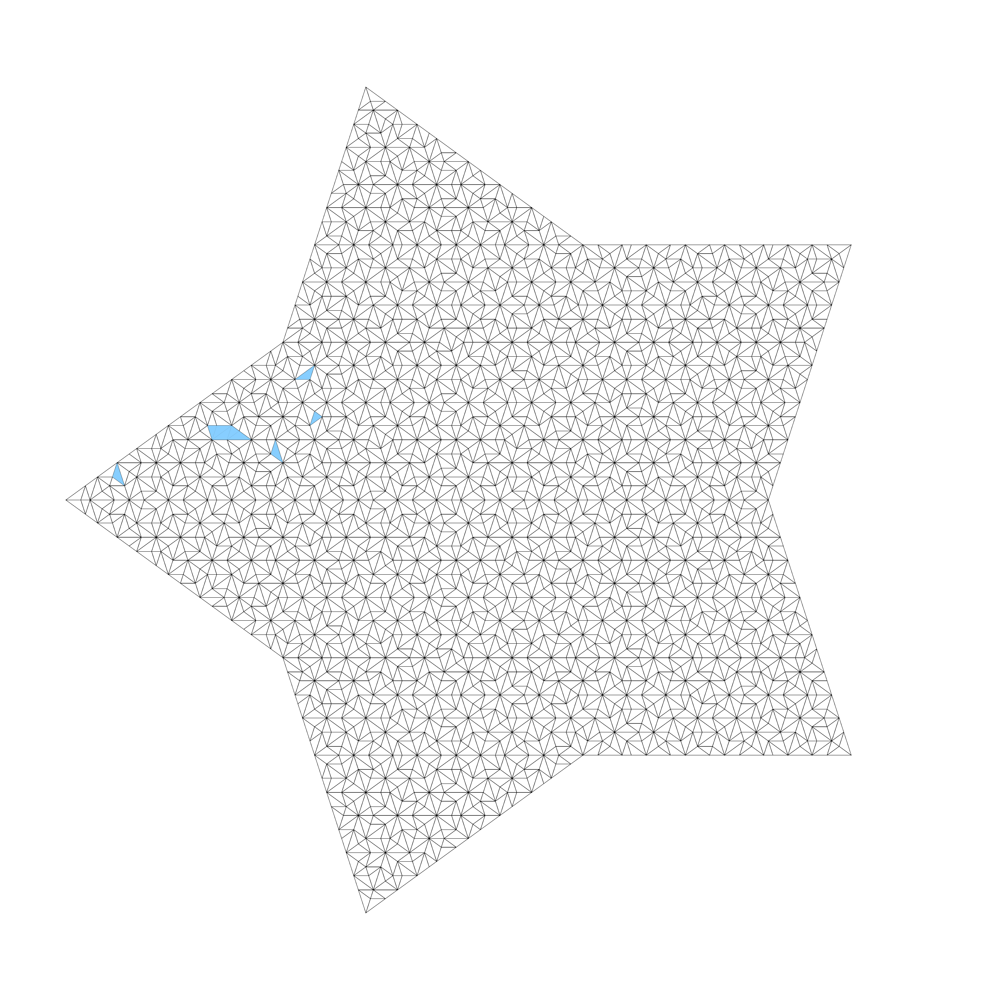

In [31]:
#Example of running the GoL code
GoL([1,100,200,145,230,2,3,4,5], 200, "test.gif", 6000)